In [1]:
import numpy as np 
import pandas as pd 
import plotly.express as px
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np
from torchvision import transforms

In [2]:
images = os.listdir('D:/rtsd/rtsd-frames/rtsd-frames/')
labels = pd.read_csv('D:/rtsd/df_all_pic.csv')

In [3]:
root_path = 'D:/rtsd/rtsd-frames/rtsd-frames/'

In [4]:
labels.head()

,filename,x_from,y_from,width,height,sign_class,sign_id
0,autosave01_02_2012_09_13_33.jpg,649,376,18,18,2_1,0
1,autosave01_02_2012_09_13_34.jpg,671,356,20,21,2_1,0
2,autosave01_02_2012_09_13_35.jpg,711,332,27,26,2_1,0
3,autosave01_02_2012_09_13_36.jpg,764,290,37,36,2_1,0
4,autosave01_02_2012_09_13_36.jpg,684,384,17,17,1_23,1


In [5]:
labels.sign_class.unique()

array(['2_1', '1_23', '1_17', '3_24_n40', '8_2_1', '5_20', '3_24_n20',
       '5_19_1', '5_16', '3_25_n20', '6_16', '7_15', '2_2', '2_4',
       '8_13_1', '4_2_1', '1_20_3', '1_25', '3_4_n8', '8_3_2', '3_4_1',
       '4_1_6', '4_2_3', '4_1_1', '1_33', '5_15_5', '3_27', '1_15',
       '4_1_2_1', '6_3_1', '8_1_1', '6_7', '5_15_3', '7_3', '1_19', '6_4',
       '8_1_4', '8_8', '1_16', '1_11_1', '6_6', '5_15_1', '7_2', '5_15_2',
       '7_12', '3_18', '5_6', '5_5', '7_4', '4_1_2', '8_2_2', '7_11',
       '3_24_n5', '1_22', '1_27', '2_3_2', '5_15_2_2', '1_8', '3_13_r5',
       '2_3', '8_3_3', '2_3_3', '7_7', '1_11', '8_13', '3_24_n30',
       '1_12_2', '1_20', '1_12', '3_24_n60', '3_24_n70', '3_24_n50',
       '3_32', '2_5', '3_1', '4_8_2', '3_20', '3_13_r4.5', '3_2', '2_3_6',
       '5_22', '5_18', '2_3_5', '7_5', '8_4_1', '3_13_r3.7', '3_14_r3.7',
       '1_2', '1_20_2', '4_1_4', '7_6', '8_1_3', '8_3_1', '4_3', '4_1_5',
       '8_2_3', '8_2_4', '3_24_n80', '1_31', '3_10', '4_2_2', '3_13_r2

In [6]:
labels.sign_class.describe()

count     104358
unique       198
top       5_19_1
freq       24264
Name: sign_class, dtype: object

Наиболее частовстречаемый класс - 5_19_1. Всего различных классов дорожных знаков в нашем датасете - 198.
Как видно из подсчетов элементов в каждом классе и из графиков ниже, довольно много классов с очень маленьким количеством фотографий. Количество самого популярного класса в 2 с лишним раза больше, чем второго по популярности, что плохо.

Если хочется убрать метки классов с буквами, которые по-разному классифицируют знаки снижения скорости 30, 60 и т.д., то можно выполнить код, представленный ниже.

In [52]:
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_24' if '3_24_n40' in str(x) or '3_24_n20' in str(x) or '3_24_n30' in str(x) or '3_24_n10' in str(x) or '3_24_n80' in str(x) or '3_24_n60' in str(x) or '3_24_n70' in str(x)   or '3_24_n5' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '6_2' if '6_2_n50' in str(x) or '6_2_n60' in str(x) or '6_2_n70' in str(x) or '6_2_n20' in str(x) or '6_2_n40' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_25' if '3_25_n20' in str(x)  or '3_25_n80' in str(x) or '3_25_n50' in str(x) or '3_25_n40' in str(x) or '3_25_n70' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_4' if '3_4_n8' in str(x)  or '3_4_n2' in str(x) or '3_4_n5' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_13' if '3_13_r4.1' in str(x)  or '3_13_r3.5' in str(x) or '3_13_r3.3' in str(x) or '3_13_r3' in str(x) or '3_13_r4' in str(x) or '3_13_r3.9' in str(x) or '3_13_r2.5' in str(x) or '3_13_r3.7' in str(x) or '3_13_r5.2' in str(x) or '3_13_r5' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_12' if '3_12_n10' in str(x) or '3_12_n3' in str(x) or '3_12_n5' in str(x) or '3_12_n6' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_11' if '3_11_n8' in str(x) or '3_11_n17' in str(x) or '3_11_n13'  in str(x) or '3_11_n5' in str(x) or '3_11_n9' in str(x) or '3_11_n20' in str(x) or '3_11_n23' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_14' if '3_14_r3.5' in str(x) or '3_14_r2.7' in str(x) or '3_14_r3' in str(x)  else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_16' if '3_16_n3' in str(x) or '3_16_n1' in str(x) else x)

In [7]:
labels['sign_class'].value_counts()

sign_class
5_19_1       24264
2_1          10961
5_16          5172
5_15_2        4944
2_4           4095
             ...  
8_3_3            2
3_13_r3.7        2
2_3_5            1
3_33             1
3_13_r3.3        1
Name: count, Length: 198, dtype: int64

In [11]:
grouped_data = labels.groupby('sign_class').size().reset_index(name='count')
grouped_data = grouped_data.sort_values(by='count', ascending=False)
fig = px.bar(grouped_data, x='sign_class' ,y ='count', labels={'sign_class': 'sign_class'}, color_discrete_sequence=['magenta'], title=f'Distribution of sign_class')
fig.show()

In [12]:
grouped_data.describe()

,count
count,198.000000
mean,527.060606
std,2002.931422
min,1.000000
25%,14.250000
50%,84.000000
75%,310.000000
max,24264.000000


In [13]:
grouped_data_1 = grouped_data.head(99)
grouped_data_2 = grouped_data[99:198]
fig = px.bar(grouped_data_1, x='sign_class', y='count', title=f'Distribution of sign_class', color_discrete_sequence=['magenta'])
fig.show()
fig = px.bar(grouped_data_2, x='sign_class', y='count', title=f'Distribution of sign_class', color_discrete_sequence=['magenta'])
fig.show()

In [14]:
grouped_data_2 = grouped_data[grouped_data['count'] < 527]
grouped_data_1 = grouped_data[grouped_data['count'] >= 527]
fig = px.bar(grouped_data_1, x='sign_class', y='count', title=f'Distribution of sign_class', color_discrete_sequence=['magenta'])
fig.show()
fig = px.bar(grouped_data_2, x='sign_class', y='count', title=f'Distribution of sign_class', color_discrete_sequence=['magenta'])
fig.show()

In [15]:
def make_marking(id):
    im_labels = labels.iloc[id]
    im = Image.open(root_path + im_labels.filename)

    fig, ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
    ax.imshow(im)
    rect = patches.Rectangle((im_labels.x_from, im_labels.y_from), im_labels.width, im_labels.height, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

    plt.show()

Посмотрим,что на изображениях, которые принадлежат к классам, размером не больше 3 фотографий.

In [16]:
grouped_data_small_ds = grouped_data[grouped_data['count'] <= 3]

In [17]:
files_index_list = []
for i in grouped_data_small_ds.sign_class:
    files_index = labels.index[labels['sign_class'] == i]
    files_index_list.append(files_index)

In [18]:
files_index_list

[Index([102416, 102419, 102422], dtype='int64'),
 Index([86729, 86731, 86733], dtype='int64'),
 Index([5120, 5123], dtype='int64'),
 Index([17829, 17830], dtype='int64'),
 Index([3443, 3445], dtype='int64'),
 Index([1282, 1313], dtype='int64'),
 Index([101579, 101580], dtype='int64'),
 Index([2697], dtype='int64'),
 Index([38169], dtype='int64'),
 Index([77259], dtype='int64')]

8_23
autosave24_10_2013_11_29_00_0.jpg


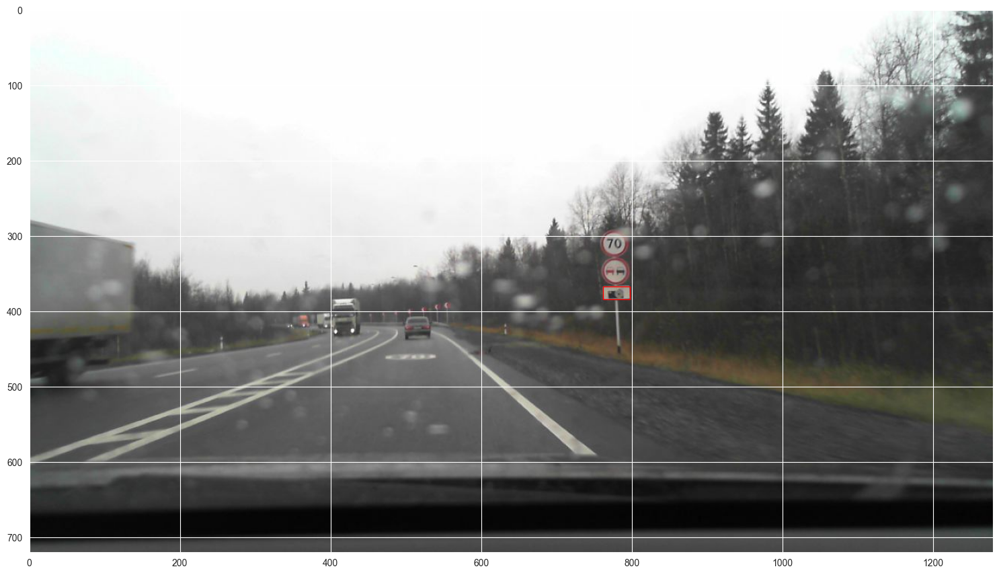

8_16
autosave23_10_2012_10_00_46_0.jpg


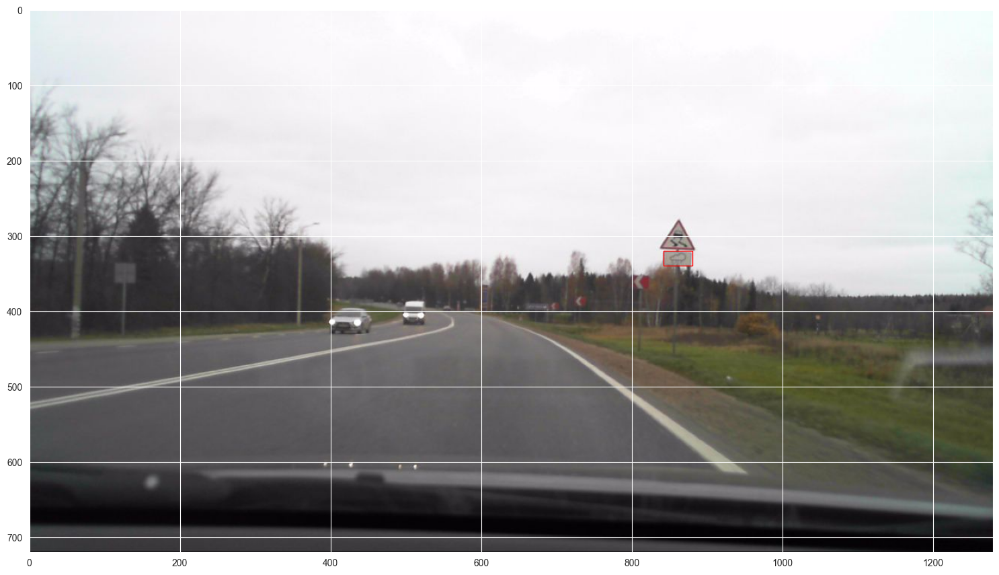

3_13_r2.5
autosave02_10_2012_12_03_18_1.jpg


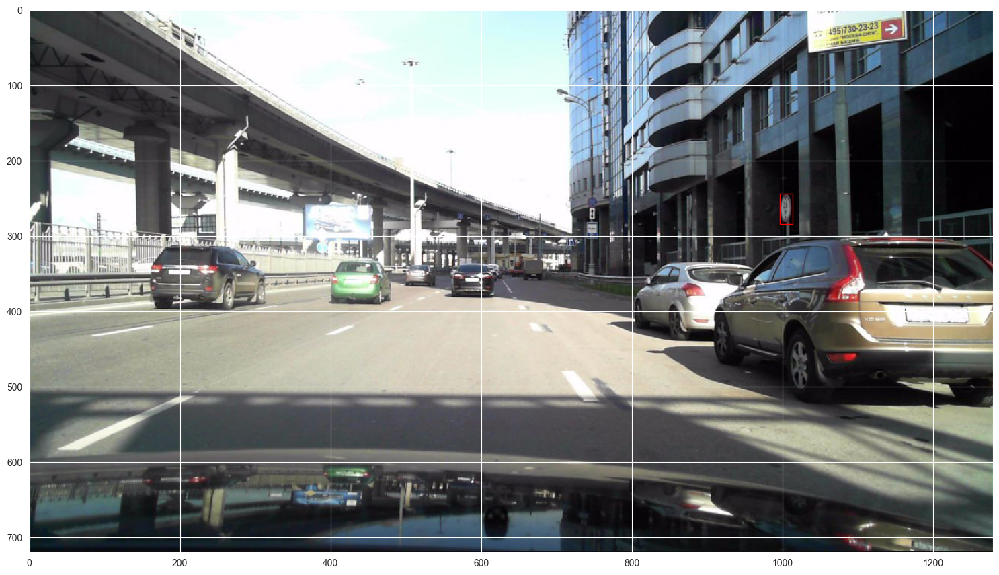

4_5
autosave09_10_2012_12_42_29_0.jpg


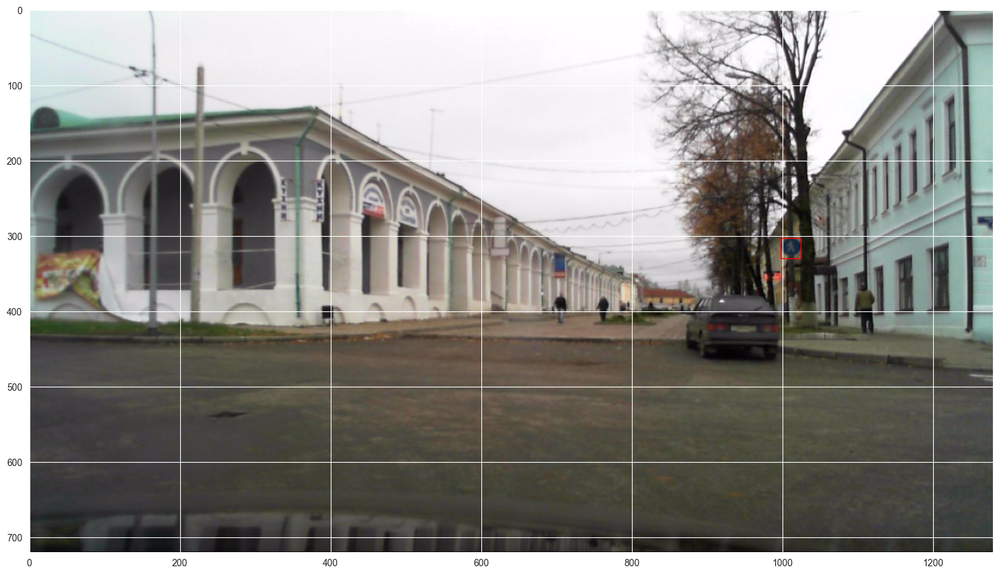

3_13_r3.7
autosave01_02_2012_12_44_09.jpg


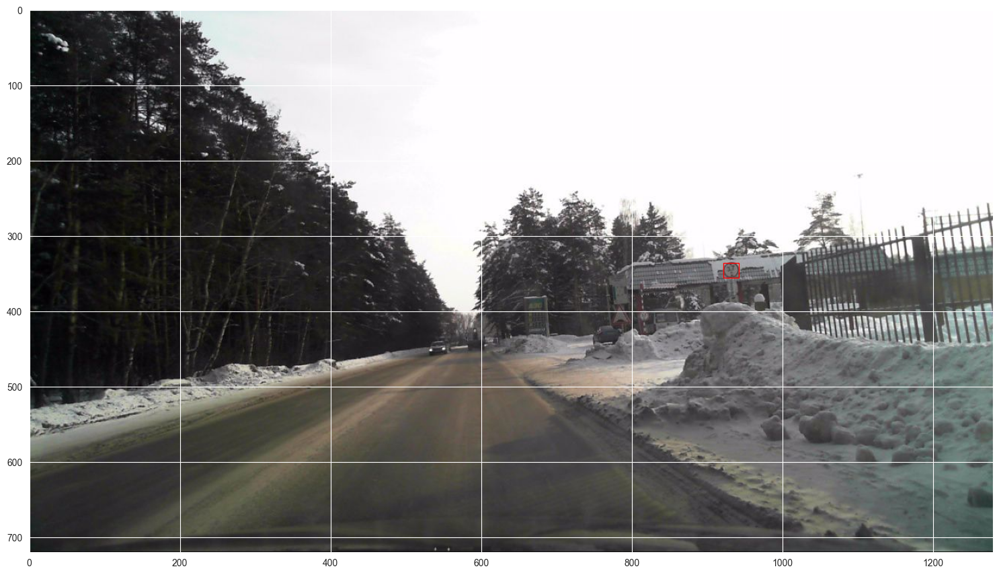

8_3_3
autosave01_02_2012_10_11_31.jpg


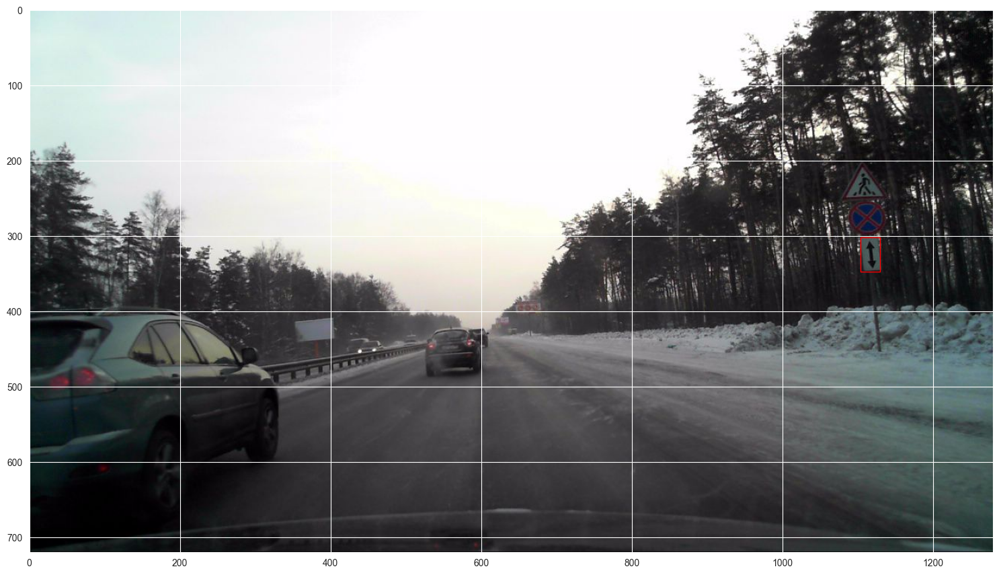

3_13_r5.2
autosave24_10_2013_11_11_04_1.jpg


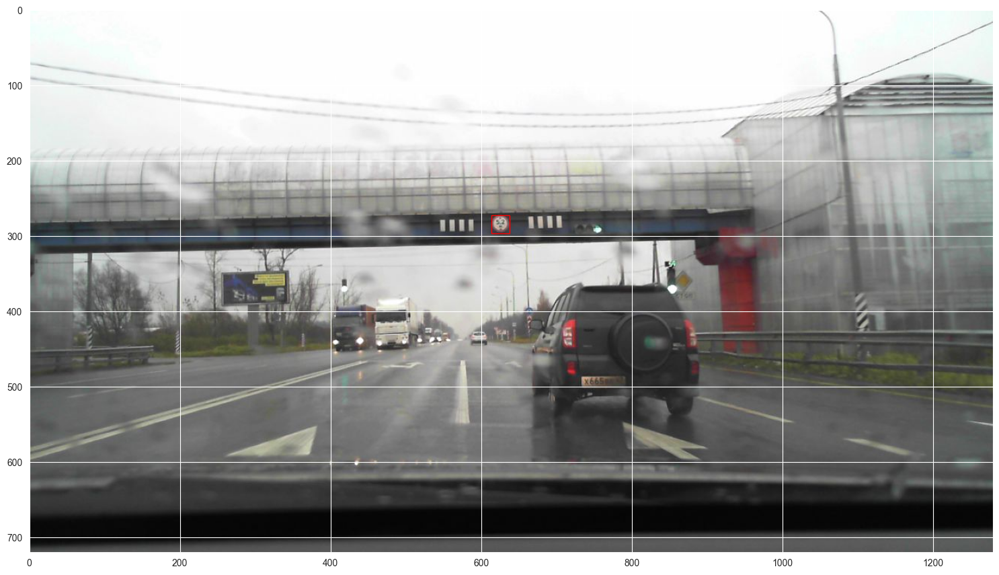

2_3_5
autosave01_02_2012_11_57_49.jpg


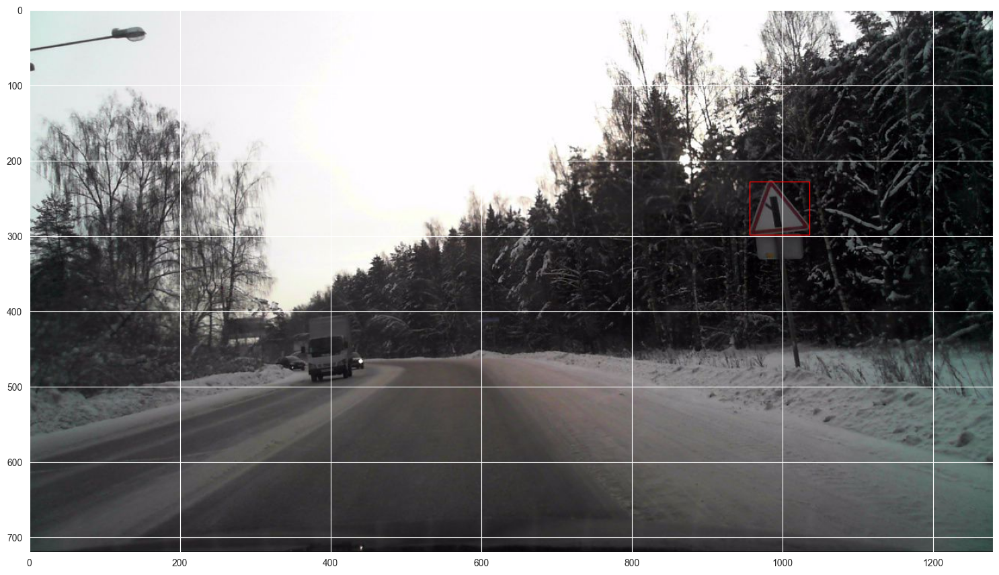

3_33
autosave10_10_2012_14_10_54_1.jpg


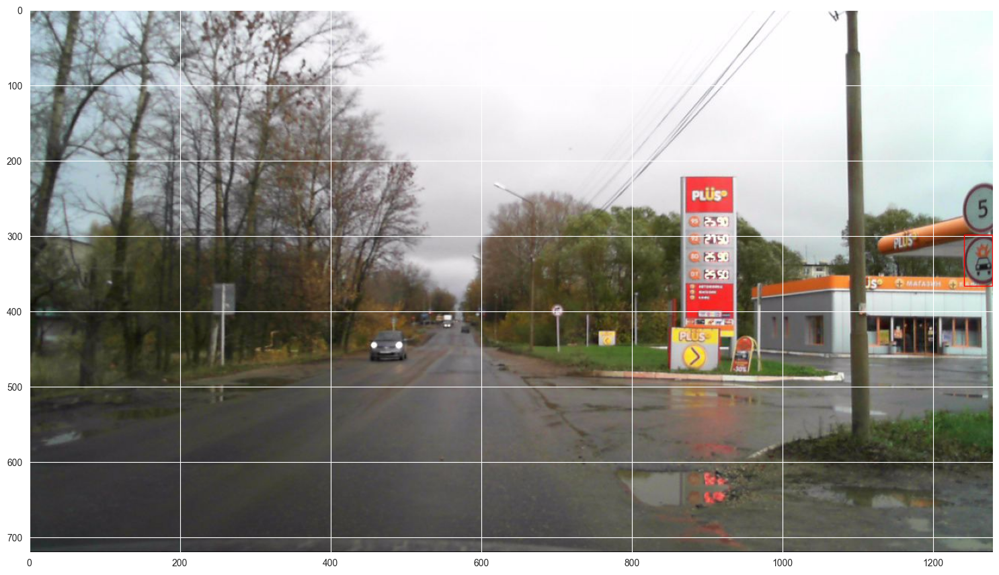

3_13_r3.3
autosave16_10_2012_11_44_38_0.jpg


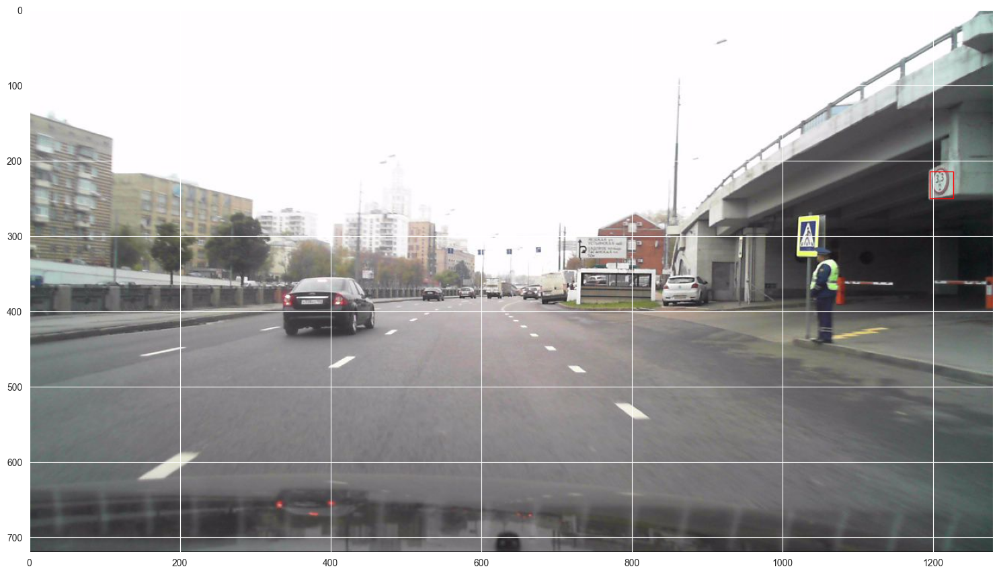

In [19]:
for class_i in files_index_list:
    print(labels['sign_class'][class_i[0]])
    path = '/kaggle/input/rtsd-dataset/rtsd-frames/rtsd-frames/'+ labels.filename[class_i[0]]
    print(labels.filename[class_i[0]])
    make_marking(class_i[0])

Наиболее популярным знаком (класс 5_19_1) является знак "Пешеходный переход". На втором месте знак (класс 3_27) "Остановка запрещена".

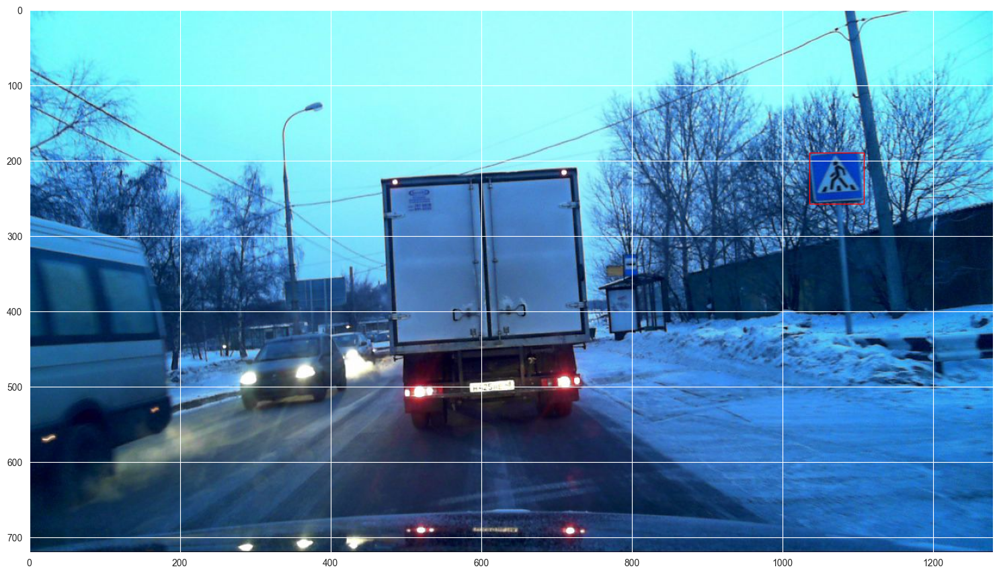

In [20]:
make_marking(labels.loc[labels.sign_class=='5_19_1'].index[20])

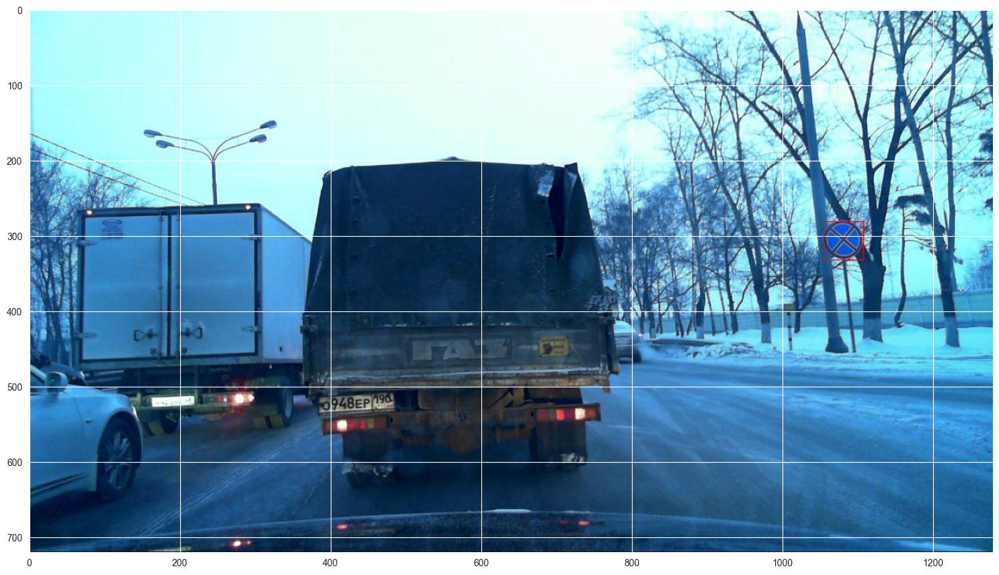

In [21]:
make_marking(labels.loc[labels.sign_class=='3_27'].index[20])

In [23]:
def make_marking_rects(indices, columns):
    rows = 198 // columns
    fig, axs = plt.subplots(rows, columns, figsize=(25, 25))
    fig.subplots_adjust(hspace=0.7)
    
    for i, idx in enumerate(indices):
        row, col = divmod(i, columns)
        ax = axs[row, col]
        
        im_labels = labels.iloc[idx]
        im = Image.open(root_path + im_labels.filename)
        
        x_min, y_min = im_labels.x_from, im_labels.y_from
        x_max, y_max = x_min + im_labels.width, y_min + im_labels.height

        ax.imshow(im)
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.axis('off')
    
    plt.show()

In [27]:
unique_classes = labels['sign_class'].unique()
selected_indices = []

for class_value in unique_classes:
    class_indices = labels[labels['sign_class'] == class_value].index
    random_index = np.random.choice(class_indices, size=1, replace=False)
    selected_indices.append(int(random_index))

C:\Users\Катерина\AppData\Local\Temp\ipykernel_20064\1426083413.py:7: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



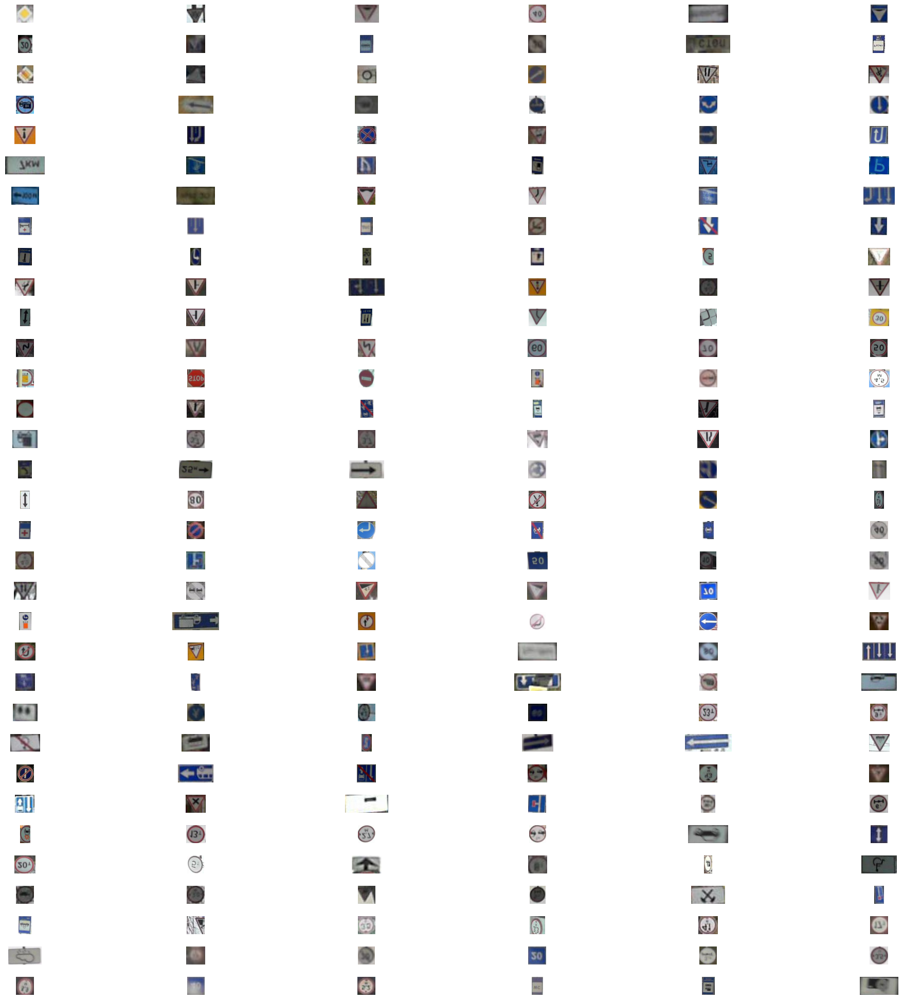

In [28]:
make_marking_rects(selected_indices, columns=6)

В ходе анализа знаков выше были найдены два очень похожих. Показалось, что в двух классах лежат одинаковые знаки. Ниже представлены картинки. Как видно, второй знак является отражением первого "Опасные повороты". Формально, знаки разные.

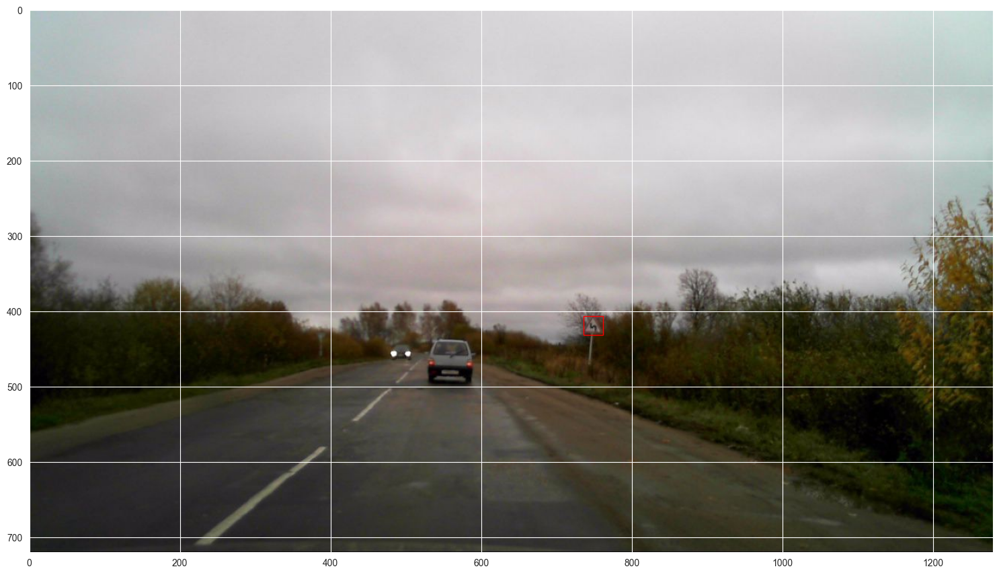

In [26]:
make_marking(selected_indices[66])

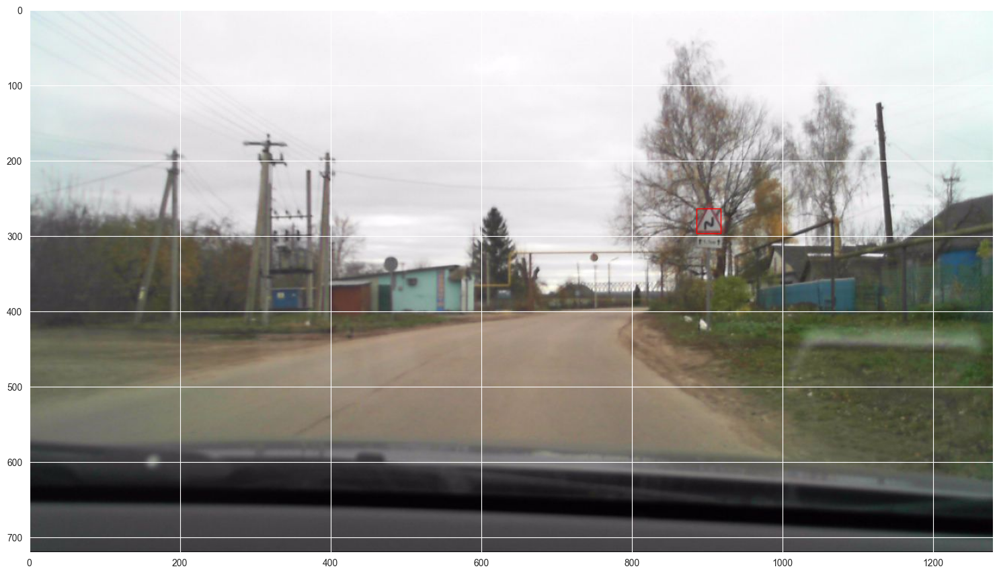

In [29]:
make_marking(selected_indices[68])

# Классификатор ResNet

In [4]:
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from tqdm.auto import tqdm
import torch
import torchvision.models as models
import torch.nn as nn
from sklearn.metrics import classification_report
from torch.nn import functional as F

Так как в качестве sign_class у нас представлена строка, необходимо ее преобразовать в какое-то числовое значение. Для этого было сделано сопоставление к каждой уникальной строке уникального числа. Так как уникальных строк 198, то и уникальных значений class получилось 198. Сопоставление реализованы как словарь.

In [5]:
class_mapping = {class_name: class_id for class_id, class_name in enumerate(labels['sign_class'].unique())}
labels['class'] = labels['sign_class'].map(class_mapping)

In [6]:
x_train, x_test, y_train, y_test = train_test_split(labels[['filename','x_from', 'y_from', 'width', 'height']], labels['class'], random_state=42)

In [7]:
class CustomDataset(Dataset):
    def __init__(self, data, targets, root_path, transform=None):
        self.data = data
        self.targets = targets
        self.root_path = root_path
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
   
        x = self.data.iloc[index]
        y = self.targets.iloc[index]

        # Загрузка изображения и вырезание участка
        image_path = self.root_path + x['filename']
        
        image = Image.open(image_path)
        cropped_image = image.crop((x['x_from'], x['y_from'], x['x_from'] + x['width'], x['y_from'] + x['height']))
        
        if self.transform:
            cropped_image = self.transform(cropped_image)

        return cropped_image, y


In [9]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Размер, который ожидает ResNet
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Нормализация для ResNet
])

# Создание Dataset и DataLoader для тренировочных данных

train_dataset = CustomDataset(data=x_train, targets=y_train, root_path=root_path, transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True)

# Аналогично для тестовых данных
test_dataset = CustomDataset(data=x_test, targets=y_test, root_path=root_path, transform=transform)
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=False)

In [10]:
resnet = models.resnet50(pretrained=True)

C:\Users\Катерина\AppData\Local\Programs\Python\Python39\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Катерина\AppData\Local\Programs\Python\Python39\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [11]:
num_classes = 198
resnet.fc = nn.Linear(resnet.fc.in_features, num_classes)

# Заморозка весов предварительно обученных слоев
for param in resnet.parameters():
    param.requires_grad = False
# Разморозка весов последнего слоя
for param in resnet.fc.parameters():
    param.requires_grad = True
    
# Определение функции потерь и оптимизатора
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet.fc.parameters())

num_epochs = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet.to(device)

num_training_steps = num_epochs * len(train_dataloader)

In [21]:
def model_predictions(model, loader):
    real_target, pred_target = [], []
    resnet.to(device)

    resnet.to(device)

    for X, Y in loader:
        X, Y = X.to(device), Y.to(device)
        pred = model(X)
        pred_target.append(pred)
        real_target.append(Y)
    pred_target, real_target = torch.cat(pred_target), torch.cat(real_target)

    return real_target.detach().cpu().numpy(), F.softmax(pred_target, dim=-1).argmax(dim=-1).cpu().detach().numpy()

In [13]:
progress_bar = tqdm(range(num_training_steps))
for epoch in range(num_epochs):
    resnet.train()
    running_loss = 0.0
    
    for xb, yb in train_dataloader:
        xb, yb = xb.to(device), yb.to(device)  
        
        outputs = resnet(xb)
        loss = criterion(outputs, yb)
        optimizer.zero_grad()  
        
        loss.backward()  
        optimizer.step()  
        
        progress_bar.update(1)
        running_loss += loss.item()

    epoch_loss = running_loss / len(train_dataloader)
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss}")

    resnet.eval()
    correct = 0
    total = 0
    
    with torch.no_grad():
        for xb, yb in test_dataloader:
            xb, yb = xb.to(device), yb.to(device)
            outputs = resnet(xb)
            _, predicted = torch.max(outputs.data, 1)
            total += yb.size(0)
            correct += (predicted == yb).sum().item()

    accuracy = correct / total
    print(f"Test Accuracy: {accuracy}")

  0%|          | 0/12230 [00:00<?, ?it/s]

Epoch 1/10, Loss: 1.2948286187327114
Test Accuracy: 0.7831736297431966
Epoch 2/10, Loss: 0.7558994573934684
Test Accuracy: 0.8049827520122652
Epoch 3/10, Loss: 0.6369902314290782
Test Accuracy: 0.8201609812188578
Epoch 4/10, Loss: 0.5722479208731203
Test Accuracy: 0.8191644308164048
Epoch 5/10, Loss: 0.5259573650062815
Test Accuracy: 0.8319279417401303
Epoch 6/10, Loss: 0.4877335456362145
Test Accuracy: 0.8379455730164814
Epoch 7/10, Loss: 0.45989454780093786
Test Accuracy: 0.8366423917209659
Epoch 8/10, Loss: 0.43820047323711564
Test Accuracy: 0.8415484860099655
Epoch 9/10, Loss: 0.4158916026110154
Test Accuracy: 0.8390187811422001
Epoch 10/10, Loss: 0.39769358799556
Test Accuracy: 0.841855116903028


In [22]:
real_target, pred_target = model_predictions(resnet, test_dataloader)

In [23]:
print(classification_report(real_target, pred_target))

              precision    recall  f1-score   support

           0       0.99      0.96      0.97      2788
           1       0.63      0.92      0.75       718
           2       0.81      0.79      0.80       302
           3       0.83      0.68      0.75       570
           4       0.80      0.92      0.86       239
           5       0.94      0.78      0.85       507
           6       0.70      0.49      0.57       192
           7       0.93      0.97      0.95      5999
           8       0.90      0.98      0.94      1309
           9       0.83      0.50      0.62        20
          10       0.84      0.98      0.90       271
          11       0.00      0.00      0.00         6
          12       0.77      0.79      0.78       141
          13       0.74      1.00      0.85      1035
          14       0.88      0.72      0.79        39
          15       0.76      0.87      0.81       290
          16       0.27      0.54      0.36        24
          17       0.79    

C:\Users\Катерина\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Катерина\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Катерина\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, m

In [14]:
torch.save(resnet, 'classification_model.pth')